In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df= pd.read_csv(r'census.csv')
df.head()

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,<=50K
1,50,Self-emp-not-inc,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.0,0.0,13.0,United-States,<=50K
2,38,Private,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.0,0.0,40.0,United-States,<=50K
3,53,Private,11th,7.0,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0.0,0.0,40.0,United-States,<=50K
4,28,Private,Bachelors,13.0,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0.0,0.0,40.0,Cuba,<=50K


### Data Exploration

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45222 entries, 0 to 45221
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   age              45222 non-null  int64  
 1   workclass        45222 non-null  object 
 2   education_level  45222 non-null  object 
 3   education-num    45222 non-null  float64
 4   marital-status   45222 non-null  object 
 5   occupation       45222 non-null  object 
 6   relationship     45222 non-null  object 
 7   race             45222 non-null  object 
 8   sex              45222 non-null  object 
 9   capital-gain     45222 non-null  float64
 10  capital-loss     45222 non-null  float64
 11  hours-per-week   45222 non-null  float64
 12  native-country   45222 non-null  object 
 13  income           45222 non-null  object 
dtypes: float64(4), int64(1), object(9)
memory usage: 4.8+ MB


In [6]:
# exploring the education numeric column
df['education-num'].value_counts().head()

9.0     14783
10.0     9899
13.0     7570
14.0     2514
11.0     1959
Name: education-num, dtype: int64

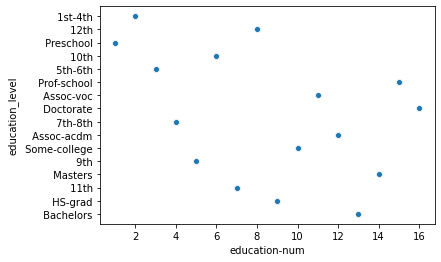

In [7]:
# exploring the relationship between Education numeric and level columns
sns.scatterplot(df['education-num'], df.education_level);

So the education level and the education num are directly related in the dataset.

In [8]:
# Checking for the missing values
df.isna().sum()

age                0
workclass          0
education_level    0
education-num      0
marital-status     0
occupation         0
relationship       0
race               0
sex                0
capital-gain       0
capital-loss       0
hours-per-week     0
native-country     0
income             0
dtype: int64

So there are no missing values in the data

In [9]:
df.income.value_counts()

<=50K    34014
>50K     11208
Name: income, dtype: int64

In [10]:
#hot encoding the income column to 1 and 0.
df.income.replace({'<=50K':0,'>50K':1}, inplace= True)

In [11]:
df.head(1)

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,0


In [12]:
# Checking for duplicates in the data
df.duplicated().sum()

5982

There are 5982 duplicate rows in the dataset. However, it could also be that 2 people hvae the same features as the features are quite generic.

In [13]:
df.occupation.value_counts()

 Craft-repair         6020
 Prof-specialty       6008
 Exec-managerial      5984
 Adm-clerical         5540
 Sales                5408
 Other-service        4808
 Machine-op-inspct    2970
 Transport-moving     2316
 Handlers-cleaners    2046
 Farming-fishing      1480
 Tech-support         1420
 Protective-serv       976
 Priv-house-serv       232
 Armed-Forces           14
Name: occupation, dtype: int64

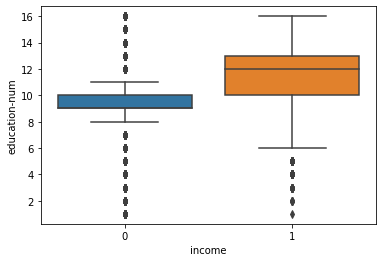

In [14]:
# relationship between the number of years of education and income level
sns.boxplot(df.income, df['education-num'])

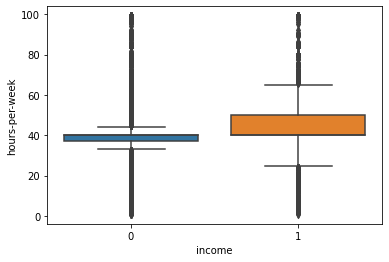

In [15]:
# relationship between the hours per week and income level
sns.boxplot(df.income, df['hours-per-week']);

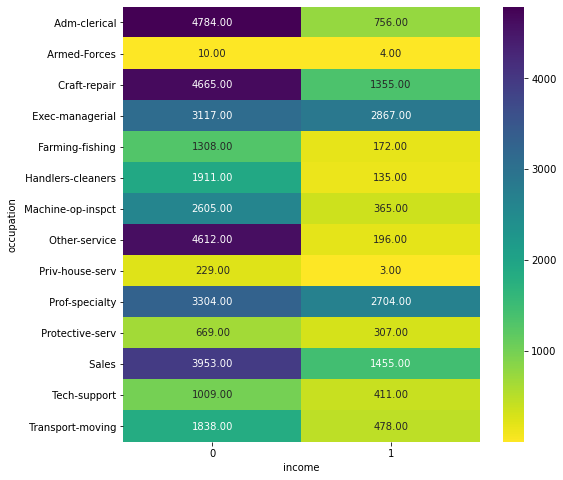

In [16]:
# Relationship between the occupation and the income level
df_occupation= df.pivot_table(columns='income', index= 'occupation', aggfunc='count')['age']
plt.figure(figsize=[8,8])
sns.heatmap(df_occupation,cmap= 'viridis_r',annot= True, fmt= '.2f' );

The above heatmap shows that most of the higher income people are either Executive managers, professional specialists or Sales professionals.

In [17]:
df['marital-status'].value_counts()

 Married-civ-spouse       21055
 Never-married            14598
 Divorced                  6297
 Separated                 1411
 Widowed                   1277
 Married-spouse-absent      552
 Married-AF-spouse           32
Name: marital-status, dtype: int64

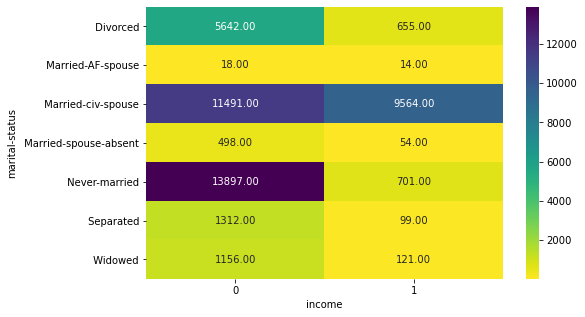

In [18]:
# Relationship between Marital status and the income level
df_marriage= df.pivot_table(columns='income', index= 'marital-status', aggfunc='count')['age']
plt.figure(figsize=[8,5])
sns.heatmap(df_marriage,cmap= 'viridis_r',annot= True, fmt= '.2f' );

Most of the higher income people are Married-civ-spouse. Overwhelming number of never married people are in the lower income bracket

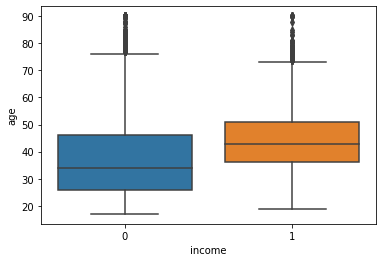

In [19]:
# Relationship between the age of people and their income
sns.boxplot(df.income, df.age);

In [20]:
df.head(1)

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,2174.0,0.0,40.0,United-States,0


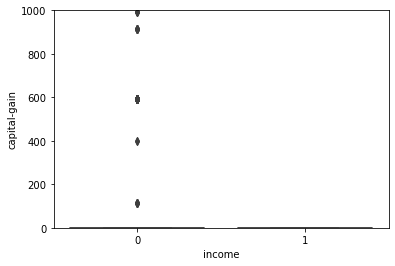

In [21]:
# Relationship between the Capital-gain and their income
sns.boxplot(df.income, df['capital-gain'], )
plt.ylim([0,1000]);

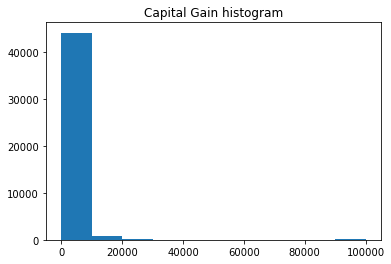

In [22]:
plt.hist(df['capital-gain'])
plt.title('Capital Gain histogram');

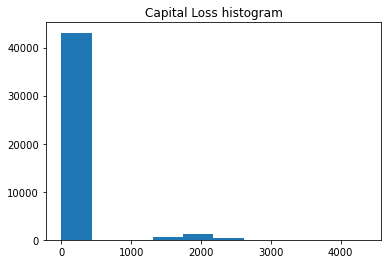

In [23]:
plt.hist(df['capital-loss'])
plt.title('Capital Loss histogram');


In [24]:


df['capital-gain']= np.log(df['capital-gain']+1)

df['capital-loss']= np.log(df['capital-loss']+1)

In [25]:
df.head(3)

,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,Bachelors,13.0,Never-married,Adm-clerical,Not-in-family,White,Male,7.684784,0.0,40.0,United-States,0
1,50,Self-emp-not-inc,Bachelors,13.0,Married-civ-spouse,Exec-managerial,Husband,White,Male,0.000000,0.0,13.0,United-States,0
2,38,Private,HS-grad,9.0,Divorced,Handlers-cleaners,Not-in-family,White,Male,0.000000,0.0,40.0,United-States,0


In [26]:
# Standard Scaling all the numerical columns
from sklearn.preprocessing import StandardScaler
scale= StandardScaler()

numerical = ['age','education-num','capital-gain', 'capital-loss','hours-per-week']
df[numerical]= scale.fit_transform(df[numerical])

In [27]:
df.columns.difference(numerical)

Index(['education_level', 'income', 'marital-status', 'native-country',
       'occupation', 'race', 'relationship', 'sex', 'workclass'],
      dtype='object')

In [28]:

categorical= ['education_level','marital-status','native-country','occupation','race', 'relationship','sex','workclass']
df_categorical= pd.get_dummies(df[categorical])
df_categorical.shape

df_numerical= df[numerical]

#combining the numerical and the categorical dataframes together
df_new= df_categorical.join(df_numerical, )
df_new.head(1)

,education_level_ 10th,education_level_ 11th,education_level_ 12th,education_level_ 1st-4th,education_level_ 5th-6th,education_level_ 7th-8th,education_level_ 9th,education_level_ Assoc-acdm,education_level_ Assoc-voc,education_level_ Bachelors,...,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,age,education-num,capital-gain,capital-loss,hours-per-week
0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,1,0,0.034201,1.128753,2.815336,-0.222752,-0.07812


In [29]:
# Sending the manipulated and cleaned data to a local csv file
df_new.to_csv(r'df_new.csv',\
             index= False)

In [30]:
df['income'].to_csv(r'df_y.csv',\
             header= True,index= False)

### Predicting the response

In [31]:


from sklearn.model_selection import train_test_split
y= df['income']
X_train, X_test, y_train, y_test = train_test_split(df_new, y, test_size= 0.30, random_state= 42,stratify= y)

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, fbeta_score, auc, roc_curve
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

In [33]:
import time

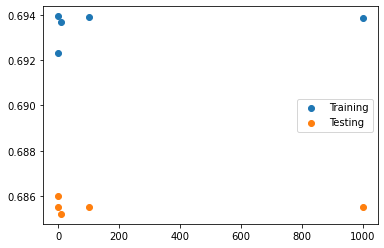

2.3750343322753906 s


In [34]:

C_param= [0.1,1,10,100,1000] # C_param is the hyperparameter
f_test_list= []
f_train_list= []
start= time.time()

for c in C_param:
    model= LogisticRegression(solver= 'liblinear',C= c)
    model.fit(X_train, y_train)

    prediction_train=model.predict(X_train)
    prediction_test=model.predict(X_test)
    
    f_train=fbeta_score(y_train, prediction_train,beta=0.5 )
    f_test= fbeta_score(y_test, prediction_test,beta=0.5 )
     
    f_train_list.append(f_train)
    f_test_list.append(f_test)

# Plotting AUC vs C parameter
plt.scatter(x=C_param, y= f_train_list, label= 'Training')
plt.scatter(x=C_param, y= f_test_list, label='Testing')
plt.legend()
plt.show()
end= time.time()
print(end-start,'s')

In [35]:
from sklearn.preprocessing import PolynomialFeatures 
from time import time

In [36]:
X_train, X_test, y_train, y_test = train_test_split(df_new, y, test_size= 0.30, random_state= 35,stratify= y)

In [37]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier

In [38]:
model= DecisionTreeClassifier(min_samples_leaf=1)

model.fit(X_train, y_train)

prediction_train=model.predict(X_train)
prediction_test=model.predict(X_test)

f_train=fbeta_score(y_train, prediction_train,beta=0.5 )
f_test= fbeta_score(y_test, prediction_test,beta=0.5 )

print(f_train, f_test)

0.9665748690534046 0.6340425531914894


In [39]:
# Random Forest Classifier
K= [1,2,3,4,5]
esti = [2,3,4,5]
f_train_list=[]
f_test_list=[]

for k in K:
    for e in esti:
        model= RandomForestClassifier(n_estimators=150,criterion= 'entropy', max_depth=50, min_samples_leaf=k,\
                                      min_samples_split= e  )

        model.fit(X_train, y_train)

        prediction_train=model.predict(X_train)
        prediction_test=model.predict(X_test)

        f_train=fbeta_score(y_train, prediction_train,beta=1)
        f_test= fbeta_score(y_test, prediction_test,beta=1 )

        f_train_list.append(f_train)
        f_test_list.append(f_test)
        print(k,e,f_train, f_test)


1 2 0.9465846552282292 0.6617950754567117
1 3 0.9306335728282169 0.6701821668264621
1 4 0.9032899973467764 0.6792452830188679
1 5 0.8849912973624313 0.6781295195243452
2 2 0.7616522467206253 0.6872030149106997
2 3 0.7580509661159339 0.6892247043363995
2 4 0.7604013190205571 0.6889291001809509
2 5 0.7600504272307047 0.6872840927784175
3 2 0.7245780740320521 0.6844636047090035
3 3 0.7277241770715096 0.6862257583291894
3 4 0.7240571063285745 0.6872727272727273
3 5 0.7261155505268369 0.6870781893004115
4 2 0.7091337570520603 0.6873023797636878
4 3 0.7124010554089709 0.6848906560636183
4 4 0.7102058257958835 0.6847086169682882
4 5 0.7105939463163907 0.6843421710855428
5 2 0.7035104025166226 0.6825767690253671
5 3 0.6985018726591761 0.677175918161999
5 4 0.7029894616101513 0.6817118020728853
5 5 0.7021611564333763 0.6799264582985125


In [40]:
# Seeing the relative importance of different features in the dataset
imp =pd.DataFrame({'Feature':X_train.columns, 'Importance':model.feature_importances_})
imp['Columns']= imp['Feature'].apply(lambda x: x.split('_')[0])
imp.groupby(by='Columns', ).sum().sort_values(by='Importance', ascending= False)

,Importance
Columns,
marital-status,0.215365
relationship,0.157835
capital-gain,0.133490
education-num,0.096568
occupation,0.092766
age,0.086802
education,0.069625
hours-per-week,0.050654
sex,0.030618


In [41]:
# Undertaking a one hot encoding for the Categorical variables in the 
categorical= ['marital-status','occupation', 'relationship','workclass']
df_categorical2= pd.get_dummies(df[categorical])

df_numerical= df[numerical]


df_new_drop= df_categorical2.join(df_numerical, )
df_new_drop.head(1)

,marital-status_ Divorced,marital-status_ Married-AF-spouse,marital-status_ Married-civ-spouse,marital-status_ Married-spouse-absent,marital-status_ Never-married,marital-status_ Separated,marital-status_ Widowed,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,...,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,age,education-num,capital-gain,capital-loss,hours-per-week
0,0,0,0,0,1,0,0,1,0,0,...,0,0,0,1,0,0.034201,1.128753,2.815336,-0.222752,-0.07812


In [42]:
X_train, X_test, y_train, y_test = train_test_split(df_new_drop, y, test_size= 0.30, random_state= 42,stratify= y)

In [43]:
# Random Forest Classifier that generalized best was with hyperparameter with n_estimators=130 and max_depth =40
model= RandomForestClassifier(n_estimators=120,criterion= 'entropy', max_depth=40   )

model.fit(X_train, y_train)

prediction_train=model.predict(X_train)
prediction_test=model.predict(X_test)

fpr1, tpr1, threshold1= roc_curve(y_train, prediction_train, )
fpr2, tpr2, threshold2= roc_curve(y_test, prediction_test, )

auc_train=auc(fpr1,tpr1)
auc_test =auc(fpr2,tpr2)
print(k,e,auc_train, auc_test)

5 5 0.9506307402846471 0.7668132405263776


In [44]:
# Finding the relative importance betweent he predictors
imp =pd.DataFrame({'Feature':X_train.columns, 'Importance':model.feature_importances_})
imp['Columns']= imp['Feature'].apply(lambda x: x.split('_')[0])
imp.groupby(by='Columns', ).sum().sort_values(by='Importance', ascending= False)

,Importance
Columns,
age,0.255317
education-num,0.126049
marital-status,0.125408
hours-per-week,0.123348
capital-gain,0.112549
relationship,0.092180
occupation,0.087613
workclass,0.039800
capital-loss,0.037736


In [45]:
# importing the testing data

test = pd.read_csv(r'test_census.csv')#,\

test.head()

,Unnamed: 0,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,0,21.0,Private,10th,6.0,Married-civ-spouse,Craft-repair,Husband,White,Male,0.0,0.0,40.0,United-States
1,1,49.0,Private,Bachelors,13.0,Married-civ-spouse,Adm-clerical,Wife,White,Female,0.0,0.0,40.0,United-States
2,2,44.0,Self-emp-not-inc,Assoc-acdm,12.0,Married-civ-spouse,Other-service,Wife,White,Female,0.0,0.0,99.0,United-States
3,3,34.0,Private,Bachelors,13.0,Married-civ-spouse,Sales,Husband,White,Male,7298.0,0.0,46.0,United-States
4,4,24.0,Private,HS-grad,9.0,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0.0,0.0,40.0,United-States


In [46]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45222 entries, 0 to 45221
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       45222 non-null  int64  
 1   age              45205 non-null  float64
 2   workclass        45200 non-null  object 
 3   education_level  45202 non-null  object 
 4   education-num    45208 non-null  float64
 5   marital-status   45201 non-null  object 
 6   occupation       45200 non-null  object 
 7   relationship     45206 non-null  object 
 8   race             45203 non-null  object 
 9   sex              45203 non-null  object 
 10  capital-gain     45207 non-null  float64
 11  capital-loss     45205 non-null  float64
 12  hours-per-week   45209 non-null  float64
 13  native-country   45206 non-null  object 
dtypes: float64(5), int64(1), object(8)
memory usage: 4.8+ MB


In [47]:
# Data manipulation on the test data
test.columns

test.rename(columns={'Unnamed: 0':'id'}, inplace=True)

test.head(1)

,id,age,workclass,education_level,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,0,21.0,Private,10th,6.0,Married-civ-spouse,Craft-repair,Husband,White,Male,0.0,0.0,40.0,United-States


In [48]:
# Changing to log values
test['capital-loss']= np.log(test['capital-loss']+1)
test['capital-gain']= np.log(test['capital-gain']+1)

In [49]:
#Scaling all the numerical columns
scale= StandardScaler()

numerical = ['age','education-num','capital-gain', 'capital-loss','hours-per-week']
test[numerical]= scale.fit_transform(test[numerical])

In [50]:
test[['capital-gain', 'capital-loss',]].median(axis=0)

capital-gain   -0.300342
capital-loss   -0.222741
dtype: float64

In [51]:
test.fillna(value={'capital-gain':-0.300342,'capital-loss':-0.222741}, inplace= True)
test.isna().sum()

id                  0
age                17
workclass          22
education_level    20
education-num      14
marital-status     21
occupation         22
relationship       16
race               19
sex                19
capital-gain        0
capital-loss        0
hours-per-week     13
native-country     16
dtype: int64

In [52]:
test_numerical= test[numerical]
test_numerical.fillna(test_numerical.mean(),inplace= True )

In [53]:
test_numerical.isna().sum()

age               0
education-num     0
capital-gain      0
capital-loss      0
hours-per-week    0
dtype: int64

In [54]:
categorical= ['education_level','marital-status','native-country','occupation','race', 'relationship','sex','workclass']
test_cat = test[categorical]
test_cat.isna().sum()

education_level    20
marital-status     21
native-country     16
occupation         22
race               19
relationship       16
sex                19
workclass          22
dtype: int64

In [55]:
values = {'education_level':'HS-grad', 'marital-status': 'Married-civ-spouse', 'native-country':'United-States',\
          'occupation':'Craft-repair', 'race':'White', 'relationship':'Husband', 'sex':'Male', 'workclass':'Private'}
test_cat.fillna(values, inplace= True)
test_cat.isna().sum()

education_level    0
marital-status     0
native-country     0
occupation         0
race               0
relationship       0
sex                0
workclass          0
dtype: int64

In [56]:
# Undertaking a one hot encoding for the Categorical variables in the 

test_categorical= pd.get_dummies(test[categorical])
print(test_categorical.shape)

#combining the numerical and the categorical dataframes together
test_new= test_categorical.join(test_numerical, )
test_new.head(1)

(45222, 98)


,education_level_ 10th,education_level_ 11th,education_level_ 12th,education_level_ 1st-4th,education_level_ 5th-6th,education_level_ 7th-8th,education_level_ 9th,education_level_ Assoc-acdm,education_level_ Assoc-voc,education_level_ Bachelors,...,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,age,education-num,capital-gain,capital-loss,hours-per-week
0,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,-1.327686,-1.613345,-0.300342,-0.222741,-0.078231


In [57]:
test_new.to_csv(r'test_new.csv',\
               index= False)

In [58]:
# Predicting the response for the test data
model= RandomForestClassifier(n_estimators=150,criterion= 'entropy', max_depth=50, min_samples_leaf=1,\
                             min_samples_split=2)
model.fit(df_new,y)
test_predict= model.predict(test_new)

train_pred = model.predict(df_new)
fbeta_score(y,train_pred, beta=0.5)

0.9493589271240144

In [59]:
test['income']=test_predict
test.head(1)
test.income.sum()

10767

In [60]:
submission = test[['id', 'income']]
submission.shape

(45222, 2)

In [61]:
submission.to_csv(r'submission1122021.csv', index= False)